# Face Detection with YOLOv8




## Overview
Masks play a crucial role in protecting individuals' health against respiratory diseases, serving as one of the primary precautions available for COVID-19 in the absence of immunization. In this project, I aim to develop a model using a specific dataset to detect individuals wearing masks, those not wearing them, or wearing masks improperly. For the model algorithm, I employ YOLOv8 pretraine model by Ultralytics to train the dataset.

The reason for selecting the YOLO algorithm as the backbone of this project is its remarkable speed, being 1000x and 100x faster than R-CNN and Fast R-CNN, respectively. Moreover, it demonstrates acute precision in mean Average Precision (mAP) [1]. Additionally, the algorithm has shown superior performance compared to the one used in the benchmark paper in terms of detection, segmentation, and classification across various use cases compared with R-CNN [2].

## Preparing Dataset

This project is using Face Mask Detection from Kaggle that has 3 classes, there are:
* With mask
* Without mask
* Mask worn incorrectly

You can acessing this dataset with this [url](https://www.kaggle.com/datasets/andrewmvd/face-mask-detection/data)

In [ ]:
# import dataset from kaggle
!kaggle datasets download -d andrewmvd/face-mask-detection

Dataset URL: https://www.kaggle.com/datasets/andrewmvd/face-mask-detection
License(s): CC0-1.0
 95% 377M/398M [00:05<00:00, 59.9MB/s]
100% 398M/398M [00:05<00:00, 81.2MB/s]


In [ ]:
# unzip the dataset
import zipfile

local_file = '/content/face-mask-detection.zip'
zip_ref = zipfile.ZipFile(local_file, 'r')
zip_ref.extractall('/content')
zip_ref.close()

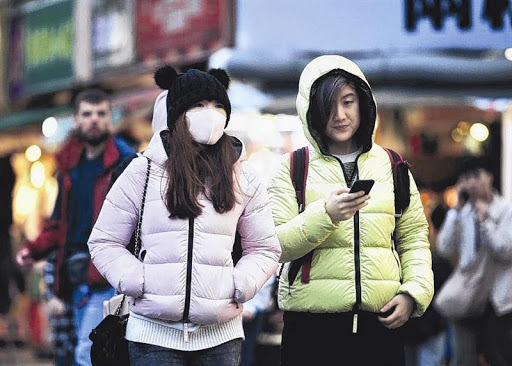

In [ ]:
# image preview
from PIL import Image
Image.open('/content/images/maksssksksss0.png')

In [ ]:
# image annotation preview
with open('/content/annotations/maksssksksss0.xml') as file:
  print(file.read())


<annotation>
    <folder>images</folder>
    <filename>maksssksksss0.png</filename>
    <size>
        <width>512</width>
        <height>366</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>without_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>79</xmin>
            <ymin>105</ymin>
            <xmax>109</xmax>
            <ymax>142</ymax>
        </bndbox>
    </object>
    <object>
        <name>with_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</truncated>
        <occluded>0</occluded>
        <difficult>0</difficult>
        <bndbox>
            <xmin>185</xmin>
            <ymin>100</ymin>
            <xmax>226</xmax>
            <ymax>144</ymax>
        </bndbox>
    </object>
    <object>
        <name>without_mask</name>
        <pose>Unspecified</pose>
        <truncated>0</

As we can see in the preview, the dataset annotation is in Pascal
format. However, for YOLO model, it is has its own format called yolo format. The difference between these two format is in coordinat value. Pascal has [x_min, y_min, x_max, y_max] format with x_min and y_min are coordinates of the top-left corner and x_max and y_max are coordinates of bottom-right corner of the bounding box, while yolo has [x_center, y_center, width, height] format with x_center and y_center are the normalized coordinates of the centre of the bounding box. The width and height are the normalized length. So, before we jump to the dataset splitting, we need to convert the Pascal format into yolo format.

In [ ]:
# importing all modules for converting pascal to yolo coordinates
import os
import xml.etree.ElementTree as ET

In [ ]:
# create function for converting
def pascal_to_yolo(pascal_file):
    # define variable to mapping label string in pascal to integer code in yolo
    label_mapping = {'with_mask': 0, 'without_mask': 1, 'mask_weared_incorrect': 2}

    # get the pascal filename and make it txt as yolo format saved in txt
    # default save yolo label set to labels directory
    # first, checking the label directory if it exists or not
    label_dir = '/content/labels'
    if not os.path.exists(label_dir):
      os.makedirs(label_dir)
    filename = (((pascal_file.split('/'))[-1]).split('.'))[0]
    yolo_file = f'{label_dir}/{filename}.txt'

    # get the coordinates in string format and change it into int format
    # we need to get width and height
    tree = ET.parse(pascal_file)
    root = tree.getroot()
    width = int(root.find('size').find('width').text)
    height = int(root.find('size').find('height').text)

    with open(yolo_file, 'w') as file:
      for obj in root.findall('object'):
            class_name = obj.find('name').text
            if class_name not in label_mapping:
                continue
            class_id = label_mapping[class_name]

            xmin = int(obj.find('bndbox').find('xmin').text)
            ymin = int(obj.find('bndbox').find('ymin').text)
            xmax = int(obj.find('bndbox').find('xmax').text)
            ymax = int(obj.find('bndbox').find('ymax').text)

            # counting the x_center, y_center, width, and height
            x_center = (xmin + xmax) / 2 / width
            y_center = (ymin + ymax) / 2 / height
            box_width = (xmax - xmin) / width
            box_height = (ymax - ymin) / height

            # write these coordinates into yolo txt
            file.write(f"{class_id} {x_center} {y_center} {box_width} {box_height}\n")
    return f"succes convert {pascal_file} into {yolo_file}"

In [ ]:
# convert all pascal file in annotations directory
pascal_dir_path = '/content/annotations'
for file in os.listdir(pascal_dir_path):
    if file.endswith('.xml'):
        result = pascal_to_yolo(os.path.join(pascal_dir_path, file))
        print(result)

succes convert /content/annotations/maksssksksss582.xml into /content/labels/maksssksksss582.txt
succes convert /content/annotations/maksssksksss422.xml into /content/labels/maksssksksss422.txt
succes convert /content/annotations/maksssksksss296.xml into /content/labels/maksssksksss296.txt
succes convert /content/annotations/maksssksksss786.xml into /content/labels/maksssksksss786.txt
succes convert /content/annotations/maksssksksss499.xml into /content/labels/maksssksksss499.txt
succes convert /content/annotations/maksssksksss228.xml into /content/labels/maksssksksss228.txt
succes convert /content/annotations/maksssksksss46.xml into /content/labels/maksssksksss46.txt
succes convert /content/annotations/maksssksksss264.xml into /content/labels/maksssksksss264.txt
succes convert /content/annotations/maksssksksss495.xml into /content/labels/maksssksksss495.txt
succes convert /content/annotations/maksssksksss746.xml into /content/labels/maksssksksss746.txt
succes convert /content/annotati

In [ ]:
# after all labels in yolo format, the next step is splitting dataset into train and test
# train dir is for training model
# test dir is for testing model that not seen model during training model
# the precentage of the splitting dataset is using 80:20 ratio with 80% for train dir and 20% for test dir

# importing all modules needed
import random
from shutil import copyfile

# define all dataset path
image_folder = "/content/images"
label_folder = "/content/labels"
train_folder = "/content/data/train"
test_folder = "/content/data/test"

# create train and test folders
os.makedirs('/content/data')
os.makedirs(train_folder)
os.makedirs(test_folder)

In [ ]:
# set split ratio
split_ratio = 0.2

image_files = os.listdir(image_folder)
random.shuffle(image_files)

# counting split index
split_index = int(len(image_files) * split_ratio)

# aplit image files into train and test
train_images = image_files[split_index:]
test_images = image_files[:split_index]

In [ ]:
# splitting and moving image to train dir
for image_file in train_images:
    # copy image file to train folder
    src_image_path = os.path.join(image_folder, image_file)
    dst_image_path = os.path.join(train_folder, image_file)
    copyfile(src_image_path, dst_image_path)

    # copy label file to train folder
    label_file = os.path.splitext(image_file)[0] + ".txt"
    src_label_path = os.path.join(label_folder, label_file)
    dst_label_path = os.path.join(train_folder, label_file)
    copyfile(src_label_path, dst_label_path)

In [ ]:
# splitting and moving image to test dir
for image_file in test_images:
    # Copy image file to test folder
    src_image_path = os.path.join(image_folder, image_file)
    dst_image_path = os.path.join(test_folder, image_file)
    copyfile(src_image_path, dst_image_path)

    # Copy label file to test folder
    label_file = os.path.splitext(image_file)[0] + ".txt"
    src_label_path = os.path.join(label_folder, label_file)
    dst_label_path = os.path.join(test_folder, label_file)
    copyfile(src_label_path, dst_label_path)

In [ ]:
# in YOLO algorithm, specially from Ultralytics, to begin training model you need
# to define dataset path in yaml file and also define the labels on there
dataset_yaml = f"""
    train: /content/data/train
    val: /content/data/test

    nc: 3
    names:
        0 : with_mask
        1 : without_mask
        2 : mask_weared_incorrect
    """
# write the yaml
with open('dataset.yaml', 'w') as f:
    f.write(dataset_yaml)

# preview of yaml
%cat dataset.yaml


    train: /content/data/train
    val: /content/data/test

    nc: 3
    names:
        0 : with_mask
        1 : without_mask
        2 : mask_weared_incorrect
    

## Training Model

In [ ]:
# before training, we should check whether we use gpu or not
# using cpu only (without gpu) will effect the training duration and performance
# so we need to make sure if we use gpu for training
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-f8c918e2-fb03-4505-30cd-98b06a9e277b)


In [ ]:
# download ultralytics module
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.5/755.5 kB 11.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-man

In [ ]:
# import module
from ultralytics import YOLO
# define and download pretrained model
model = YOLO("yolov8n.pt")

100%|██████████| 6.23M/6.23M [00:00<00:00, 25.2MB/s]


For YOLO pretrained models during training, you'll encounter several metrics:
* Class: Indicates object class names like "person," "car," or "dog."
* Images: Number of validation set images containing the object class.
* Instances: Total count of the class across all validation set images.
* Box (P, R, mAP50, mAP50-95):
    * P (Precision): Accuracy of detected objects, showing correct detections.
    * R (Recall): Model's ability to identify all object instances.
    * mAP50: Mean average precision at IoU threshold of 0.50, assessing accuracy for "easy" detections.
    * mAP50-95: Average of mAPs at varying IoU thresholds (0.50 to 0.95), providing a comprehensive view across different detection difficulty levels.

In [ ]:
# start training
model.train(data="/content/dataset.yaml", epochs=100)

Ultralytics YOLOv8.2.9 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/dataset.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train6, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxe

train: Scanning /content/data/train.cache... 683 images, 0 backgrounds, 0 corrupt: 100%|██████████| 683/683 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))



/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/data/test.cache... 170 images, 0 backgrounds, 0 corrupt: 100%|██████████| 170/170 [00:00<?, ?it/s]


Plotting labels to runs/detect/train6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train6
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      3.49G      1.303      1.381      1.051         77        640: 100%|██████████| 43/43 [00:23<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.23it/s]

                   all        170        642      0.901      0.206      0.434      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.72G      1.284      1.174       1.05        110        640: 100%|██████████| 43/43 [00:22<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.06it/s]

                   all        170        642      0.432      0.414      0.445       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.65G       1.26       1.11      1.046        100        640: 100%|██████████| 43/43 [00:24<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.10it/s]

                   all        170        642      0.818      0.618      0.647      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.98G      1.254      1.069      1.046         61        640: 100%|██████████| 43/43 [00:23<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.16it/s]

                   all        170        642      0.689      0.527      0.602      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.82G      1.211     0.9721      1.041        153        640: 100%|██████████| 43/43 [00:23<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.26it/s]

                   all        170        642      0.634       0.54      0.582      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.85G      1.223     0.9527      1.035         86        640: 100%|██████████| 43/43 [00:23<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.84it/s]

                   all        170        642      0.825      0.445      0.504      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100       2.8G      1.196      0.917      1.022        159        640: 100%|██████████| 43/43 [00:22<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.56it/s]

                   all        170        642      0.679      0.619      0.675      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.69G      1.169     0.8504      1.026         86        640: 100%|██████████| 43/43 [00:22<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.85it/s]

                   all        170        642      0.936      0.587      0.671      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      3.01G      1.171     0.8193      1.014         71        640: 100%|██████████| 43/43 [00:21<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.06it/s]

                   all        170        642      0.848       0.58       0.65      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.93G      1.166     0.8105       1.01        163        640: 100%|██████████| 43/43 [00:21<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.73it/s]

                   all        170        642      0.756      0.669      0.741      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      3.39G      1.183     0.7837      1.011         76        640: 100%|██████████| 43/43 [00:22<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.83it/s]

                   all        170        642      0.919      0.615      0.697      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.83G      1.115     0.7435     0.9982        117        640: 100%|██████████| 43/43 [00:21<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.99it/s]

                   all        170        642      0.786      0.687      0.763      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      3.06G      1.156     0.7404     0.9908        112        640: 100%|██████████| 43/43 [00:20<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.20it/s]

                   all        170        642      0.723      0.662      0.714      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.67G       1.13     0.7378      0.995         88        640: 100%|██████████| 43/43 [00:20<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.47it/s]

                   all        170        642      0.778      0.735      0.806      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100       2.8G      1.128     0.7173      1.001         72        640: 100%|██████████| 43/43 [00:21<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.58it/s]

                   all        170        642      0.828      0.684      0.794      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         3G      1.102     0.7034     0.9964         78        640: 100%|██████████| 43/43 [00:22<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.21it/s]

                   all        170        642      0.928      0.742      0.836      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.95G      1.107     0.7247      1.003         98        640: 100%|██████████| 43/43 [00:22<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.85it/s]

                   all        170        642      0.759      0.707      0.772      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.73G       1.11     0.7062     0.9823         75        640: 100%|██████████| 43/43 [00:21<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.40it/s]

                   all        170        642      0.839      0.743       0.83      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.65G      1.083     0.6767     0.9861         88        640: 100%|██████████| 43/43 [00:22<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.35it/s]

                   all        170        642      0.896      0.672      0.816      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.69G      1.116     0.6828     0.9902         71        640: 100%|██████████| 43/43 [00:25<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.93it/s]

                   all        170        642      0.897      0.744      0.821      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.64G      1.083     0.6735     0.9875         84        640: 100%|██████████| 43/43 [00:23<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.23it/s]

                   all        170        642      0.857      0.731      0.803      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      3.04G      1.065     0.6426     0.9687         44        640: 100%|██████████| 43/43 [00:23<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.19it/s]

                   all        170        642       0.91      0.687      0.807      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.88G      1.062     0.6355     0.9863         64        640: 100%|██████████| 43/43 [00:22<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.50it/s]

                   all        170        642       0.85      0.734      0.818      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.93G      1.104     0.6458     0.9762        128        640: 100%|██████████| 43/43 [00:22<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.28it/s]

                   all        170        642      0.811      0.745      0.797      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.95G      1.064     0.6419     0.9667         81        640: 100%|██████████| 43/43 [00:22<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.31it/s]

                   all        170        642      0.846      0.724       0.81      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.95G      1.055     0.6354     0.9677        128        640: 100%|██████████| 43/43 [00:22<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.22it/s]

                   all        170        642      0.842       0.81      0.856      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.75G      1.052     0.6217     0.9671        135        640: 100%|██████████| 43/43 [00:23<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.70it/s]

                   all        170        642      0.872      0.764      0.835       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      3.15G      1.047     0.6189       0.97         94        640: 100%|██████████| 43/43 [00:23<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.06it/s]

                   all        170        642      0.864      0.701      0.791      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.79G      1.054      0.604     0.9581         51        640: 100%|██████████| 43/43 [00:23<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.06it/s]

                   all        170        642      0.842      0.743      0.801      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.78G      1.047     0.6013     0.9628         92        640: 100%|██████████| 43/43 [00:22<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.42it/s]

                   all        170        642      0.944      0.699      0.804      0.561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      3.21G      1.014     0.5866     0.9577         86        640: 100%|██████████| 43/43 [00:22<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.42it/s]

                   all        170        642      0.859      0.755      0.824       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.78G      1.021     0.5913      0.958         91        640: 100%|██████████| 43/43 [00:21<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.70it/s]

                   all        170        642      0.891      0.775      0.841       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      3.07G      1.037     0.5963     0.9639        111        640: 100%|██████████| 43/43 [00:21<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.13it/s]

                   all        170        642      0.798       0.79       0.82      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.82G       1.03     0.5891     0.9592         94        640: 100%|██████████| 43/43 [00:20<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.85it/s]

                   all        170        642      0.887      0.789      0.853      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100       2.8G       1.02     0.5816     0.9512        102        640: 100%|██████████| 43/43 [00:20<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.22it/s]

                   all        170        642      0.963      0.687      0.815      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.64G       1.01     0.5681      0.947        137        640: 100%|██████████| 43/43 [00:22<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.22it/s]

                   all        170        642       0.95      0.728      0.826      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100       2.6G     0.9945     0.5659     0.9478        101        640: 100%|██████████| 43/43 [00:22<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.32it/s]

                   all        170        642      0.881      0.746       0.85      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100       2.7G      1.028     0.5719     0.9537         77        640: 100%|██████████| 43/43 [00:22<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.34it/s]

                   all        170        642      0.837      0.754      0.845      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.61G      1.018     0.5649     0.9544        119        640: 100%|██████████| 43/43 [00:24<00:00,  1.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.78it/s]


                   all        170        642      0.806       0.74      0.797      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.64G      1.009     0.5678      0.951         46        640: 100%|██████████| 43/43 [00:24<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.34it/s]

                   all        170        642      0.945      0.739      0.817      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.82G      1.009     0.5662     0.9485         59        640: 100%|██████████| 43/43 [00:22<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.26it/s]

                   all        170        642      0.893      0.739      0.837      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      3.05G     0.9774      0.533      0.939         71        640: 100%|██████████| 43/43 [00:22<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.39it/s]

                   all        170        642      0.948      0.797      0.871      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.98G     0.9787     0.5315     0.9412        108        640: 100%|██████████| 43/43 [00:22<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.19it/s]

                   all        170        642      0.845      0.829      0.861      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100       2.7G          1     0.5386     0.9462        154        640: 100%|██████████| 43/43 [00:23<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.18it/s]

                   all        170        642      0.876      0.801      0.862      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.52G     0.9679     0.5334      0.944        150        640: 100%|██████████| 43/43 [00:22<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.32it/s]

                   all        170        642      0.924      0.752      0.855      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.59G     0.9811     0.5339     0.9468         70        640: 100%|██████████| 43/43 [00:23<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.30it/s]

                   all        170        642      0.852      0.788      0.849      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100       2.7G     0.9618     0.5244     0.9348        173        640: 100%|██████████| 43/43 [00:21<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.42it/s]

                   all        170        642      0.909      0.792      0.849      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.95G     0.9728      0.534     0.9415        103        640: 100%|██████████| 43/43 [00:21<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.65it/s]

                   all        170        642      0.811      0.826       0.87       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.71G     0.9844     0.5369     0.9409         78        640: 100%|██████████| 43/43 [00:21<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.10it/s]

                   all        170        642      0.891      0.841      0.883      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.51G     0.9571      0.527     0.9407        111        640: 100%|██████████| 43/43 [00:20<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.21it/s]

                   all        170        642      0.803       0.83      0.849      0.585



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      3.04G     0.9426     0.5184     0.9344        100        640: 100%|██████████| 43/43 [00:22<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.35it/s]

                   all        170        642      0.881      0.829      0.866      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.79G     0.9633      0.521     0.9415        124        640: 100%|██████████| 43/43 [00:23<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.31it/s]

                   all        170        642      0.906      0.827      0.881      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.85G     0.9485     0.5116     0.9343         73        640: 100%|██████████| 43/43 [00:22<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.30it/s]

                   all        170        642      0.895      0.795      0.869      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      3.05G     0.9337     0.4964     0.9314         40        640: 100%|██████████| 43/43 [00:22<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.26it/s]

                   all        170        642       0.74      0.813      0.818      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.51G     0.9543     0.4989     0.9325         80        640: 100%|██████████| 43/43 [00:22<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.31it/s]

                   all        170        642      0.864      0.824      0.873      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.77G     0.9199     0.4947     0.9341        101        640: 100%|██████████| 43/43 [00:22<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.22it/s]

                   all        170        642      0.862      0.821       0.88       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.77G     0.9253     0.4855     0.9277        151        640: 100%|██████████| 43/43 [00:22<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.81it/s]

                   all        170        642      0.884      0.806      0.865      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.93G     0.9416     0.4948     0.9252         52        640: 100%|██████████| 43/43 [00:22<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.12it/s]

                   all        170        642      0.934      0.794      0.865      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.84G     0.9331     0.4875     0.9302         73        640: 100%|██████████| 43/43 [00:20<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.17it/s]

                   all        170        642      0.893      0.799       0.87      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.64G     0.9406     0.4934     0.9251        110        640: 100%|██████████| 43/43 [00:20<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.42it/s]

                   all        170        642      0.879      0.788      0.878      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.74G     0.9137     0.4872     0.9216         79        640: 100%|██████████| 43/43 [00:21<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.33it/s]

                   all        170        642      0.945      0.762      0.849      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100       2.7G     0.9153     0.4904     0.9153         65        640: 100%|██████████| 43/43 [00:22<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.31it/s]

                   all        170        642      0.908      0.796      0.884      0.606



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      3.03G     0.9216     0.4861     0.9235        117        640: 100%|██████████| 43/43 [00:22<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.35it/s]

                   all        170        642      0.911      0.774      0.885      0.607



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.78G     0.9076     0.4756     0.9196         79        640: 100%|██████████| 43/43 [00:22<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.33it/s]

                   all        170        642      0.925      0.826      0.882      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.58G      0.915     0.4839     0.9234         70        640: 100%|██████████| 43/43 [00:22<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.39it/s]

                   all        170        642       0.92      0.802      0.879      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.83G     0.8932     0.4616     0.9181        145        640: 100%|██████████| 43/43 [00:22<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.33it/s]

                   all        170        642      0.837      0.771      0.842      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.72G       0.91     0.4747     0.9136         62        640: 100%|██████████| 43/43 [00:22<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.94it/s]

                   all        170        642      0.913      0.779      0.875      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.63G     0.9116     0.4769     0.9196        182        640: 100%|██████████| 43/43 [00:21<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.05it/s]

                   all        170        642      0.929      0.809      0.894      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.73G     0.8782     0.4562     0.9129         78        640: 100%|██████████| 43/43 [00:20<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.08it/s]

                   all        170        642      0.867      0.799      0.855      0.565



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.82G     0.9017     0.4752      0.913        111        640: 100%|██████████| 43/43 [00:20<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.46it/s]

                   all        170        642       0.89      0.817      0.878      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.63G     0.8882     0.4689     0.9131         47        640: 100%|██████████| 43/43 [00:20<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.34it/s]

                   all        170        642      0.854      0.826      0.869      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.58G     0.8619     0.4526     0.9131         89        640: 100%|██████████| 43/43 [00:23<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.28it/s]

                   all        170        642      0.936      0.805      0.879      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.84G     0.8809     0.4565     0.9163         63        640: 100%|██████████| 43/43 [00:22<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.29it/s]

                   all        170        642      0.933      0.801      0.884      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.62G     0.8634     0.4416     0.9072        121        640: 100%|██████████| 43/43 [00:22<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.27it/s]

                   all        170        642      0.935      0.796      0.874      0.618



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      3.16G     0.8878     0.4609     0.9109        164        640: 100%|██████████| 43/43 [00:23<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.37it/s]

                   all        170        642      0.951      0.789      0.885      0.619



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.81G     0.8694     0.4523     0.9062         70        640: 100%|██████████| 43/43 [00:22<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.28it/s]

                   all        170        642      0.901      0.816      0.888      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.88G       0.86     0.4432     0.9043         70        640: 100%|██████████| 43/43 [00:22<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.30it/s]

                   all        170        642      0.948      0.815      0.884      0.622



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.58G     0.8627     0.4507      0.912         69        640: 100%|██████████| 43/43 [00:24<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.89it/s]

                   all        170        642      0.926       0.79      0.878      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.71G     0.8483     0.4444     0.9007         86        640: 100%|██████████| 43/43 [00:24<00:00,  1.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.06it/s]

                   all        170        642      0.949      0.794      0.889      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.64G     0.8576     0.4405     0.9007         86        640: 100%|██████████| 43/43 [00:24<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.35it/s]

                   all        170        642      0.938      0.788       0.89       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.76G     0.8444     0.4439     0.9022        113        640: 100%|██████████| 43/43 [00:22<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.27it/s]

                   all        170        642      0.933      0.789      0.889      0.611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.82G     0.8308      0.433     0.9062         88        640: 100%|██████████| 43/43 [00:22<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.39it/s]

                   all        170        642      0.921        0.8      0.892      0.613



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.67G     0.8343     0.4321     0.9016         53        640: 100%|██████████| 43/43 [00:23<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.35it/s]

                   all        170        642      0.918      0.815      0.908      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.94G     0.8476     0.4386     0.8999        222        640: 100%|██████████| 43/43 [00:22<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.36it/s]

                   all        170        642      0.923      0.816      0.908      0.629



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      3.41G     0.8418     0.4313     0.9003        103        640: 100%|██████████| 43/43 [00:22<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.23it/s]

                   all        170        642      0.935      0.808      0.897      0.623



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.66G     0.8251     0.4275     0.9011        120        640: 100%|██████████| 43/43 [00:24<00:00,  1.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.25it/s]

                   all        170        642      0.934      0.791      0.897      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100       2.8G     0.8386     0.4242     0.8947         97        640: 100%|██████████| 43/43 [00:22<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.23it/s]

                   all        170        642      0.897      0.834      0.899      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.73G     0.8504     0.4326     0.8895         82        640: 100%|██████████| 43/43 [00:22<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.83it/s]

                   all        170        642      0.946      0.787      0.908      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      3.12G     0.8262     0.4255     0.8961         70        640: 100%|██████████| 43/43 [00:22<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.94it/s]

                   all        170        642      0.938      0.817      0.911      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100       2.9G     0.8199     0.4218     0.8932        250        640: 100%|██████████| 43/43 [00:20<00:00,  2.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.07it/s]

                   all        170        642      0.877      0.882      0.912      0.635


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.81G      0.815     0.4039     0.8902         47        640: 100%|██████████| 43/43 [00:22<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.87it/s]

                   all        170        642      0.886      0.881      0.911      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.68G     0.7995     0.3862     0.8867         36        640: 100%|██████████| 43/43 [00:18<00:00,  2.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.31it/s]

                   all        170        642      0.922       0.82       0.91      0.637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100       2.8G     0.7934      0.385     0.8805         61        640: 100%|██████████| 43/43 [00:21<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.42it/s]

                   all        170        642      0.907      0.826      0.906      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100       2.7G     0.7804     0.3787     0.8713         71        640: 100%|██████████| 43/43 [00:20<00:00,  2.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.43it/s]

                   all        170        642      0.912      0.823      0.903      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.61G     0.7839     0.3767     0.8754         93        640: 100%|██████████| 43/43 [00:21<00:00,  2.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:02<00:00,  2.72it/s]

                   all        170        642      0.915      0.824      0.914      0.632



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.76G     0.7797     0.3773     0.8835         24        640: 100%|██████████| 43/43 [00:21<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:03<00:00,  1.79it/s]

                   all        170        642       0.92      0.826      0.914      0.641



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.86G     0.7614     0.3695     0.8738        110        640: 100%|██████████| 43/43 [00:19<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.19it/s]

                   all        170        642       0.94      0.825      0.914      0.642



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.71G     0.7721     0.3697      0.874         41        640: 100%|██████████| 43/43 [00:21<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.24it/s]

                   all        170        642       0.92      0.834      0.909      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100       2.8G     0.7635     0.3696     0.8718         78        640: 100%|██████████| 43/43 [00:21<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.33it/s]

                   all        170        642      0.923      0.805      0.909      0.639



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.88G     0.7694     0.3718     0.8703         48        640: 100%|██████████| 43/43 [00:21<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:01<00:00,  3.19it/s]

                   all        170        642      0.917      0.835      0.908       0.64



100 epochs completed in 0.713 hours.
Optimizer stripped from runs/detect/train6/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train6/weights/best.pt, 6.2MB

Validating runs/detect/train6/weights/best.pt...
Ultralytics YOLOv8.2.9 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006233 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 6/6 [00:07<00:00,  1.29s/it]


                   all        170        642      0.941      0.825      0.914      0.642
             with_mask        170        521      0.958      0.904      0.959      0.691
          without_mask        170        102      0.895      0.835      0.914      0.629
 mask_weared_incorrect        170         19      0.969      0.737      0.868      0.605
Speed: 0.4ms preprocess, 4.0ms inference, 0.0ms loss, 7.2ms postprocess per image
Results saved to runs/detect/train6


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ab1cedc5a80>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04

In [ ]:
# saving the training result as zip
import shutil
shutil.make_archive("face_detection_result", 'zip','/content/runs/detect/train6')

'/content/face_detection_result.zip'

## Evaluation

Object detection models utilize various metrics for evaluation, including [3]:

* Intersection over Union (IoU): IoU measures the overlap between predicted and ground truth bounding boxes, crucial for assessing object localization accuracy.
* Average Precision (AP): AP quantifies precision-recall curve area, summarizing model precision and recall performance.
* Mean Average Precision (mAP): mAP averages AP values across multiple object classes, offering a comprehensive evaluation in multi-class detection scenarios.
* Precision and Recall: Precision gauges true positives among positive predictions, evaluating false positives avoidance, while Recall measures true positives among actual positives, assessing class detection ability.
* F1 Score: Harmonic mean of precision and recall, providing balanced performance assessment considering false positives and false negatives.


However, as for this project, i will use mAP, Precision, and Recall as metrics evaluation. These metrics choosen because these are widely accepted performance metric for object detection models [1], [2].

In [ ]:
result = model.val(data="/content/dataset.yaml")

Ultralytics YOLOv8.2.9 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/data/test.cache... 170 images, 0 backgrounds, 0 corrupt: 100%|██████████| 170/170 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 11/11 [00:07<00:00,  1.44it/s]


                   all        170        642      0.941      0.825      0.914      0.642
             with_mask        170        521      0.959      0.904      0.959      0.689
          without_mask        170        102      0.895      0.834      0.915      0.627
 mask_weared_incorrect        170         19      0.969      0.737      0.868       0.61
Speed: 0.7ms preprocess, 5.4ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/detect/train63


As you can see from table above, the model reach:

* mAP50: 91,4%
* Precission: 94,1%
* Recall: 82,5%


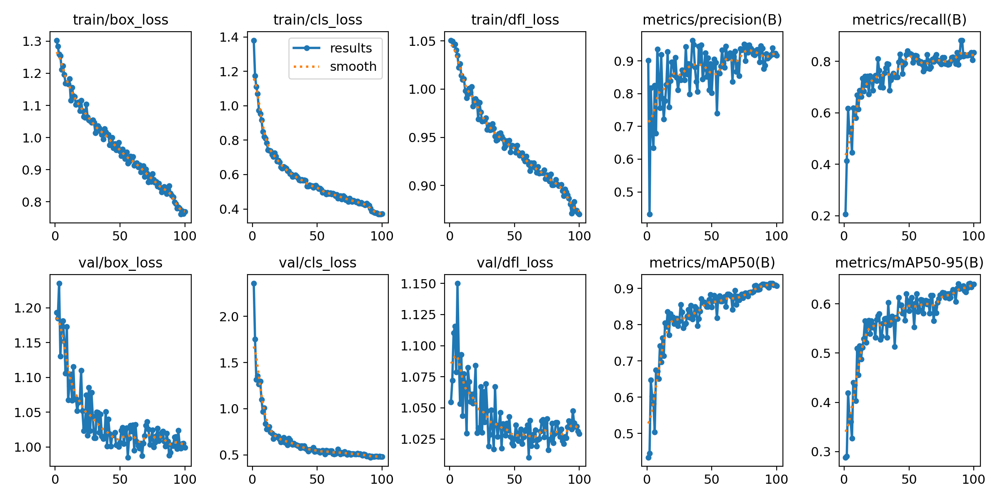

In [ ]:
# here for metrics evaluation result image
Image.open('/content/runs/detect/train6/results.png')

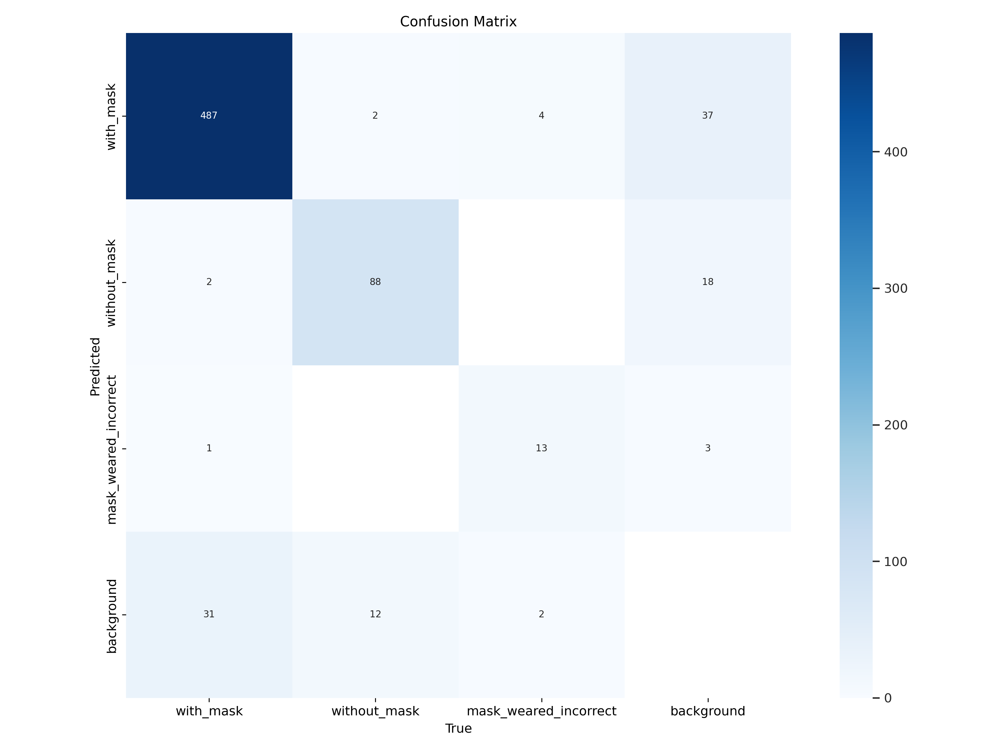

In [ ]:
# confussion matrix
Image.open('/content/runs/detect/train6/confusion_matrix.png')

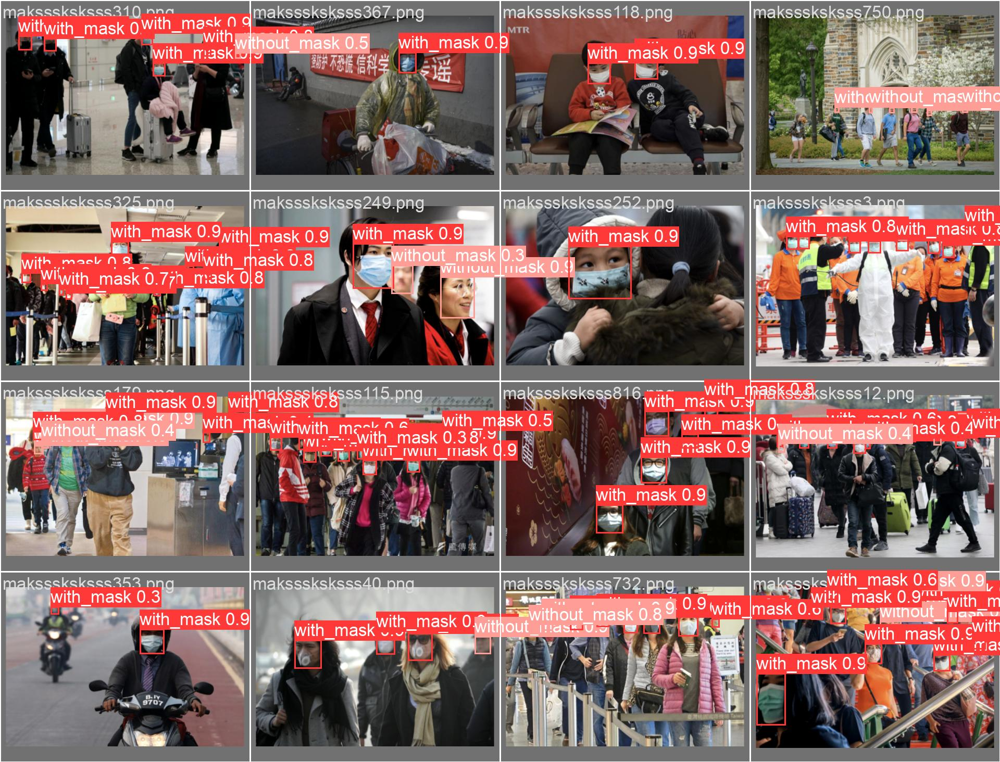

In [ ]:
# model tested on test dir
from PIL import Image

Image.open('/content/val_batch2_pred.jpg')

### Overall Evaluation Performance

With the mAP50: 91,4%, Precission: 94,1%, and Recall: 82,5% it can be seen that overall performance is good. But the model still need to be tested on different images to know whether the model is good enough to detect face mask or not. Here below the example of testing model with images that not seen in dataset.



## Model Test (Prediction)

In this section we will test the model to new image that not related to dataset to see how good model when we use in wild image.

In [ ]:
# import model best performance from training
model_test = YOLO('/content/weights/best.pt')

In [ ]:
# uploading new image
from google.colab import files

uploaded = files.upload()
for filename in uploaded.keys():
    print("File", filename, "succes upload")

Saving test2.jpg to test2.jpg
File test2.jpg succes upload


In [ ]:
# predict model and save the predicted result
model_test.predict('/content/test2.jpg', save=True)


image 1/1 /content/test2.jpg: 448x640 2 with_masks, 1 mask_weared_incorrect, 76.5ms
Speed: 3.9ms preprocess, 76.5ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict2


[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'with_mask', 1: 'without_mask', 2: 'mask_weared_incorrect'}
 obb: None
 orig_img: array([[[149, 149, 149],
         [149, 149, 149],
         [149, 150, 148],
         ...,
         [ 29,  29,  29],
         [ 28,  28,  28],
         [ 28,  28,  28]],
 
        [[149, 149, 149],
         [150, 150, 150],
         [149, 150, 148],
         ...,
         [ 28,  28,  28],
         [ 27,  27,  27],
         [ 27,  27,  27]],
 
        [[149, 150, 148],
         [149, 150, 148],
         [150, 151, 149],
         ...,
         [ 27,  27,  27],
         [ 27,  27,  27],
         [ 28,  28,  28]],
 
        ...,
 
        [[ 65,  49,  42],
         [ 64,  48,  41],
         [ 64,  48,  41],
         ...,
         [ 31,  26,  23],
         [ 31,  26,  23],
         [ 31,  26,  23]],
 
        [[ 65,  49,  42],
         [ 64,  48,  41],
        

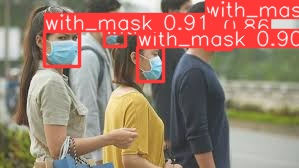

In [ ]:
# show the result predict
# i've run the model for 3 time so i will just show all result to be compared
# image test 1
Image.open('/content/runs/detect/predict2/test1 (1).jpeg')

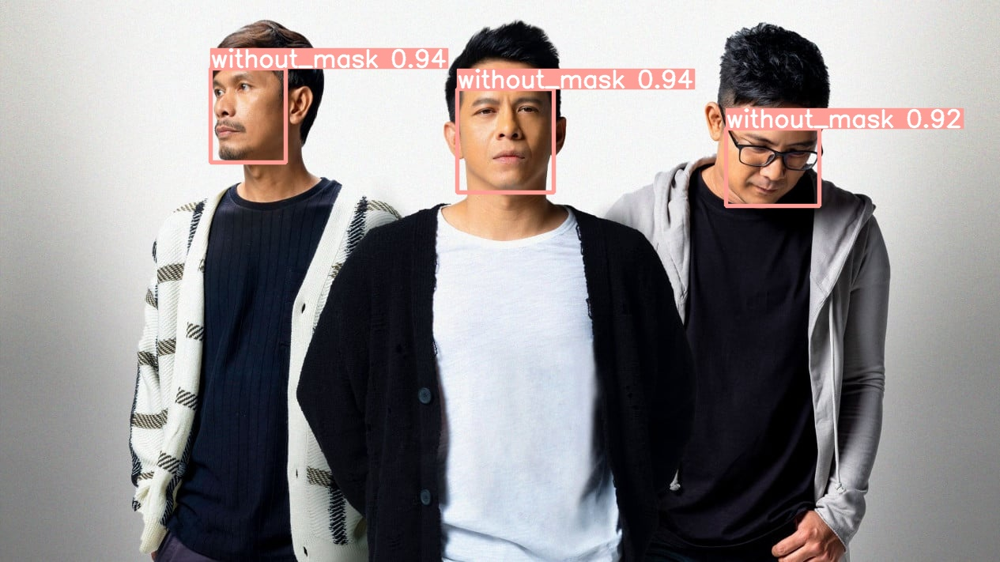

In [ ]:
# image test 2
Image.open('/content/runs/detect/predict2/64ca2968207cb-noah-luncurkan-music-video-semua-tentang-kita_1265_711.jpg')

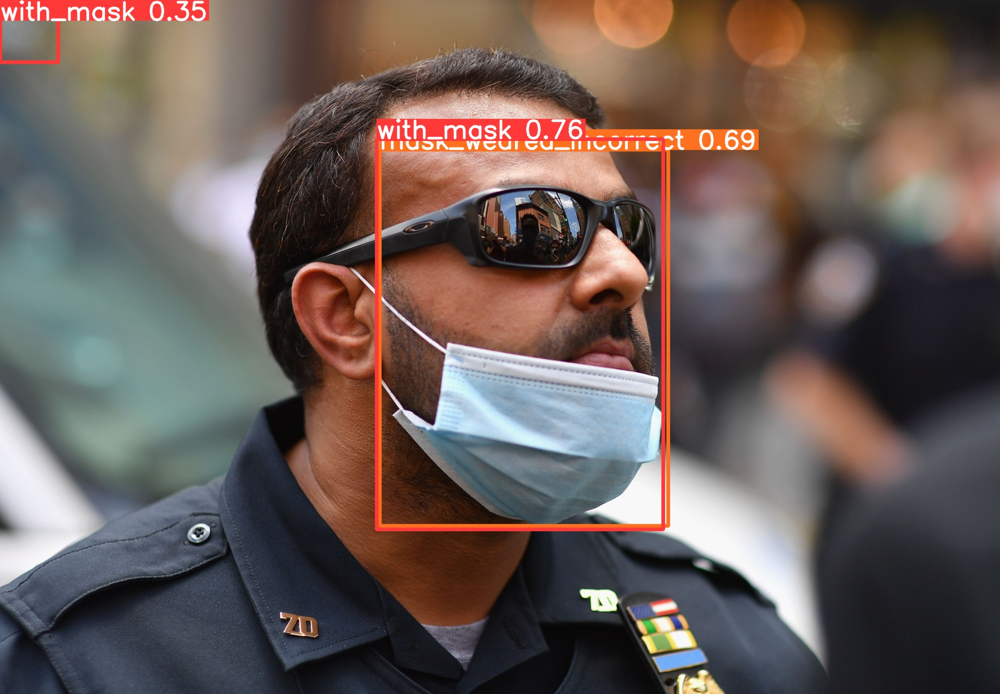

In [ ]:
# image test 3
Image.open('/content/runs/detect/predict2/test2.jpg')

From the results of three image tests, it is evident that the model performs well in detecting individuals wearing masks and those not wearing masks, achieving an average accuracy of over 80% depending on image clarity. However, when it comes to images depicting incorrect mask-wearing, the model exhibits subpar performance by incorrectly predicting individuals as wearing masks and double predicting faces, providing predictions for both wearing masks and wearing masks incorrectly. This issue arises because we haven't set a threshold for predictions, leading the model to return any prediction it can make, even those with low accuracy.

Furthermore, the dataset significantly impacts model training. The "mask weared incorrect" label has the lowest number of instances compared to other labels as you can see in the image below, resulting in the model not being sufficiently trained with this information. Consequently, when applied to real-world images, the model's performance deteriorates, particularly for the "mask weared incorrect" label.

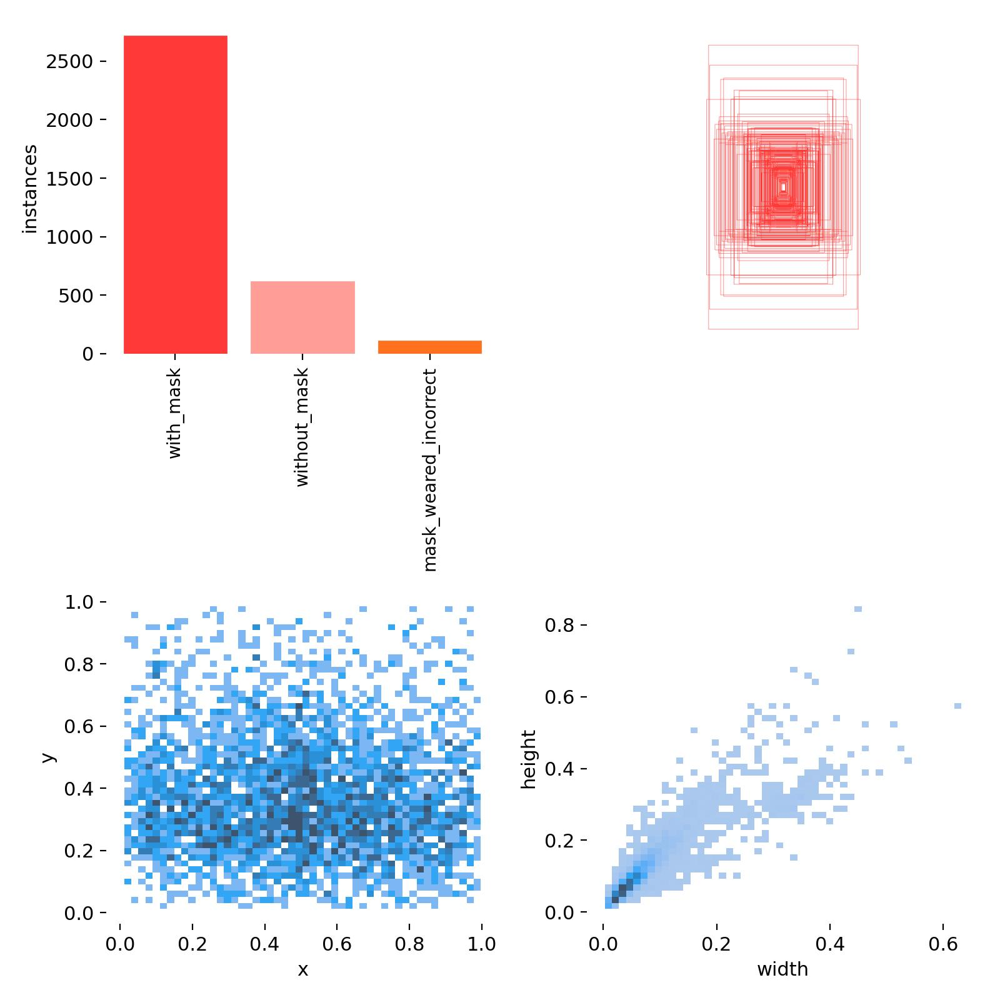



To improve the model's performance, several steps can be taken:

Retraining the model with adjusted hyperparameters.
* Augmenting the dataset to introduce more variability.
* Reviewing and correcting image annotations to prevent the model from mistaking empty images for objects.
* Increasing the number of training epochs to allow the model to learn more effectively.
* Using hyperparameter (not default parameter)

## Conclusion


The model has successfully predicted individuals wearing masks, individuals not wearing masks, and incorrect mask usage. However, there is still room for improvement, particularly in the accuracy of predicting mask weared incorrect. This issue is primarily attributed to the limited size of the dataset for the "mask weared incorrect" label. To enhance performance, several steps should be taken, including retraining the model with adjusted hyperparameters, augmenting the dataset with more diverse examples, and extending the duration of training.

## Reference


[1] Priyanka Malhotra Etc, "Object Detection Techniques: A Comparison", IEEE 7th International Conference on Smart Structures and Systems ICSSS, 2020.

[2] Jean Carlo Camacho and Manuel Eugenio Morocho-Cayamcela, "Mask R-CNN and YOLOv8 Comparison to Perform Tomato Maturity Recognition Task",  Communications in Computer and Information Science, 2023.

[3] Glenn Jocher and Ayush Chaurasia and Jing Qiu, "Ultralytics YOLOv8", https://github.com/ultralytics/ultralytics, 2023

